This notebook will create an interactive surface plot from a given 2D array. It aims to visualize the fits file with a display of flux at each position.
The notebook mainly uses function from plotly library. Some functions are from get_info_generic_78.

In [14]:
#!pip install plotly
!pip install plotly --upgrade

# https://www.geeksforgeeks.org/3d-surface-plots-using-plotly-in-python/
import plotly.graph_objects as go
import numpy as np
import sys
import os
from matplotlib import pyplot as plt              # A collection of modules. Needed here to display images and graphs.
from matplotlib.colors import LogNorm             # Machinery for LogNorm scaling of intensities.
from matplotlib.colors import SymLogNorm          # Machinery for SymLogNorm scaling of intensities.
from matplotlib.colors import PowerNorm           # Machinery for LogNorm (e.g., square root) scaling of intensities.

from astropy.io import fits                       # Need this if you want to use astropy.io io objects.
from astropy.stats import mad_std                 # The median absolute deviation, a more robust estimator than std.

In [10]:
# Define the main functions
def surf_plotly(x,y,z):
    '''
    Creates an interactive surface plot
    Input:
    x, position in row of fits file, array-like
    y, position in row of fits file, array-like
    z, contains value (i.e. flux) at a position, 2D array
    Output:
    An interactive image under the current cell
    '''
    x = x
    y = y
    z = z
    fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)])
    return fig.show()

# function for plotting .fits file and histogram
# these functions are drawn from get_info_generic_78_m1
def quickpic4(image,titlestring='',madfactor=(3.,10.),mask=([0],[0]),mask2=([0],[0]) ,csize=100,edgecolor='r',\
               edgecolor2='b', figlims=(10,10), ilims=(0.,0.), cmap='gray', plotmasks=False):
    '''
    A simple image display tool with initial autoscaling based on image median and mad_std.
    It also includes the option to plot circles around positions defined in one or two image masks.
    Arguments:
        image:       A 2D image.
        titlestring: A text string for the figure title. Default is empty string.
        madfactor:   A tuple with multipliers for mad_std to subtract or add to median to get vmin and vmax for imshow.
        mask:        A tuple of ndarrays with lists of the row and column coordinates of the circles to plot.
        mask2:       Another mask array for a second set of circles with twice the radius and different color.
        csize:       Sets size of circles for mask positions. Circles for mask2 positions are two times larger.
        edgecolor:   The color for the mask circles.
        edgecolor2:  The color for the mask2 circles.
        figlims:     Tuple to determine figsize.
        cmap:        Color map. Default = 'gray'
        plotmasks:   If True, plot circles around mask positions. Default = False.
    Author(s) = Al Harper
    Created: 190818.
    Modified: 210705, 210728, 210805.
    Version = 1.1
    '''

    pic = image.copy()
    rows, cols = pic.shape
    med, mad = np.nanmedian(pic), mad_std(pic,ignore_nan=True)
    if ilims == (0.,0.):
        vmn, vmx = med - mad * madfactor[0], med + mad * madfactor[1]
    else:
        vmn, vmx = ilims
    plt.figure(figsize = (figlims))
    plt.title(titlestring)
    plt.imshow(pic, cmap, interpolation='nearest', vmin = vmn, vmax = vmx)
    plt.colorbar(orientation = 'vertical',shrink = 0.8)
    if plotmasks == True:
        for i in mask:
            plt.scatter(mask[1],mask[0],s=csize, facecolors='none', edgecolors=edgecolor)
        for i in mask2:
            plt.scatter(mask2[1],mask2[0],s=2*csize, facecolors='none', edgecolors=edgecolor2)

In [5]:
# Check and change working directory
print('Your current directory is: {}'.format(os.getcwd()))

# change the directory to where the file is located
whichpath = '/Users\Admin\Jupyter Workspace\ASTR 29001'
path = os.chdir(whichpath)
print('Directory Changed!')
print('Your current directory is: {}'.format(os.getcwd()))


Your current directory is: C:\Users\Admin\Jupyter Workspace\ASTR 29001
Directory Changed!
Your current directory is: C:\Users\Admin\Jupyter Workspace\ASTR 29001


In [6]:
# Scan through the current directory
# create a list of names for all fits files in the directory
files = [f for f in os.listdir(whichpath) if '.fit' in f and not '_' in f]
print(files)

['g.fits', 'gz.fits', 'r.fits', 'rz.fits', 'z.fits']


In [7]:
# Read the fits file 
openfile = files[1]
thisfile = fits.getdata(openfile)
whichfile = thisfile.copy()
print('Your current file is {}'.format(openfile))

Your current file is gz.fits


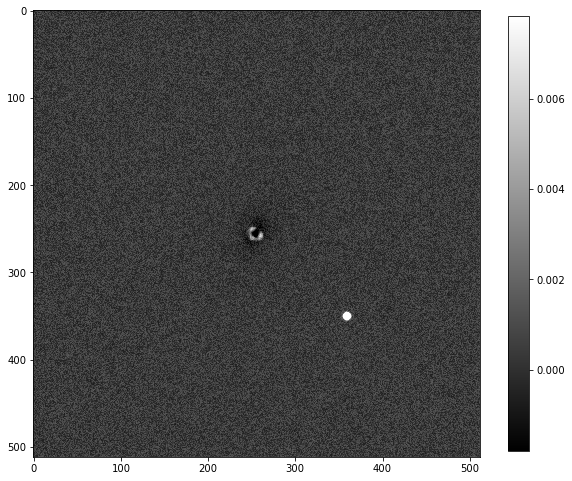

In [8]:
# plot the fits file in 2D, requires local function quickpic4()
quickpic4(whichfile)

In [11]:
# Get the dimension of the fits file
row, col = whichfile.shape
# Create two lists x,y for the function surf_plotly()
x = np.arange(row)
y = np.arange(col)
#print(x,y)
# Define fits file as z
z = whichfile
#print(z)

In [12]:
# Create a surface plot
surf_plotly(x,y,z)